<a href="https://colab.research.google.com/github/kmkkkp/2023_2_mogakso/blob/main/OpenCV_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Cascade Classifier

Haar cascade classifier

In [ ]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def imshow(title = "Image", image = None, size = 10):
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

In [ ]:
!wget https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
!wget https://moderncomputervision.s3.eu-west-2.amazonaws.com/haarcascades.zip

!unzip -qq images.zip
!unzip -qq haarcascades.zip

--2023-08-08 08:07:22--  https://moderncomputervision.s3.eu-west-2.amazonaws.com/images.zip
Resolving moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)... 52.95.150.130, 3.5.246.114, 52.95.143.34, ...
Connecting to moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)|52.95.150.130|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29586716 (28M) [application/zip]
Saving to: ‘images.zip’

images.zip          100%[===================>]  28.22M  18.6MB/s    in 1.5s    

2023-08-08 08:07:24 (18.6 MB/s) - ‘images.zip’ saved [29586716/29586716]

--2023-08-08 08:07:24--  https://moderncomputervision.s3.eu-west-2.amazonaws.com/haarcascades.zip
Resolving moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision.s3.eu-west-2.amazonaws.com)... 52.95.150.130, 3.5.246.114, 52.95.143.34, ...
Connecting to moderncomputervision.s3.eu-west-2.amazonaws.com (moderncomputervision

# Object Detection
Image Analysis.
 - one-to-one analysis : Image classification. 1사진 ->1라벨
 - One-to-many analysis : Object Detection  1사진 -> 다수의 라벨

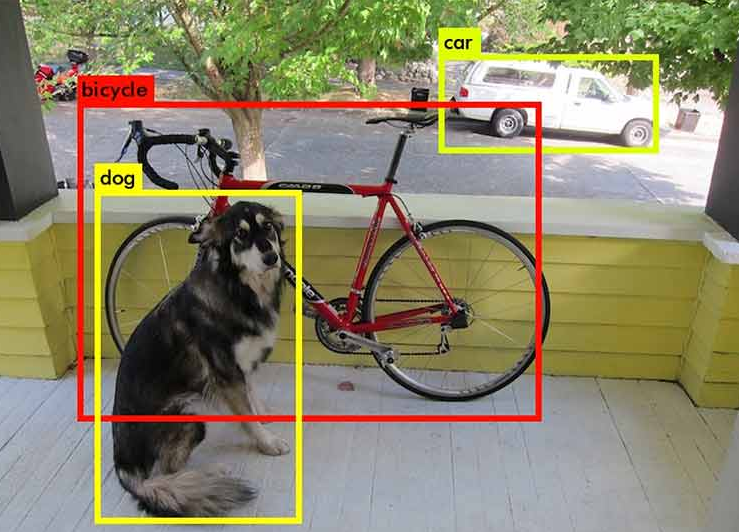

## **HAAR Cascade Classifiers**

![](https://github.com/rajeevratan84/ModernComputerVision/raw/main/haar.png)

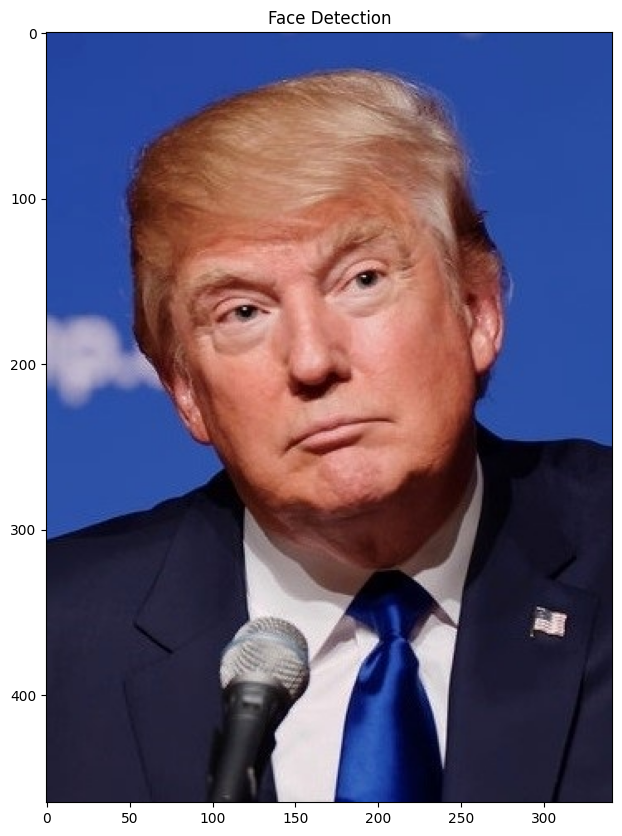

In [ ]:
face_classifier = cv2.CascadeClassifier('Haarcascades/haarcascade_frontalface_default.xml')

image = cv2.imread('images/Trump.jpg')
imshow('Face Detection', image)

face_classifier.detectMultiScale(gray, scaleFactor = 1.3, minNeighbors = 5)

detectMultiScale(const Mat& image, vector<Rect>& objects, double scaleFactor=1.1, int minNeighbors=3, int flags=0, Size minSize=Size(), Size maxSize=Size())

<>:4: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:4: SyntaxWarning: "is" with a literal. Did you mean "=="?
<ipython-input-4-2fce91856d76>:4: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if faces is ():


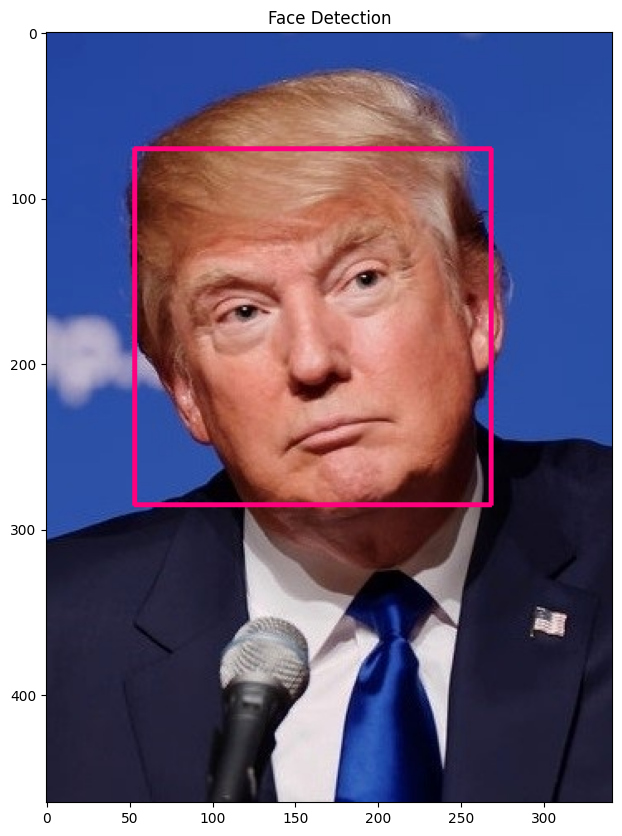

In [ ]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
faces = face_classifier.detectMultiScale(gray, scaleFactor = 1.3, minNeighbors = 5)

if faces is ():
    print("No faces found")

for (x,y,w,h) in faces:
    cv2.rectangle(image, (x,y), (x+w,y+h), (127,0,255), 2)

imshow('Face Detection', image)


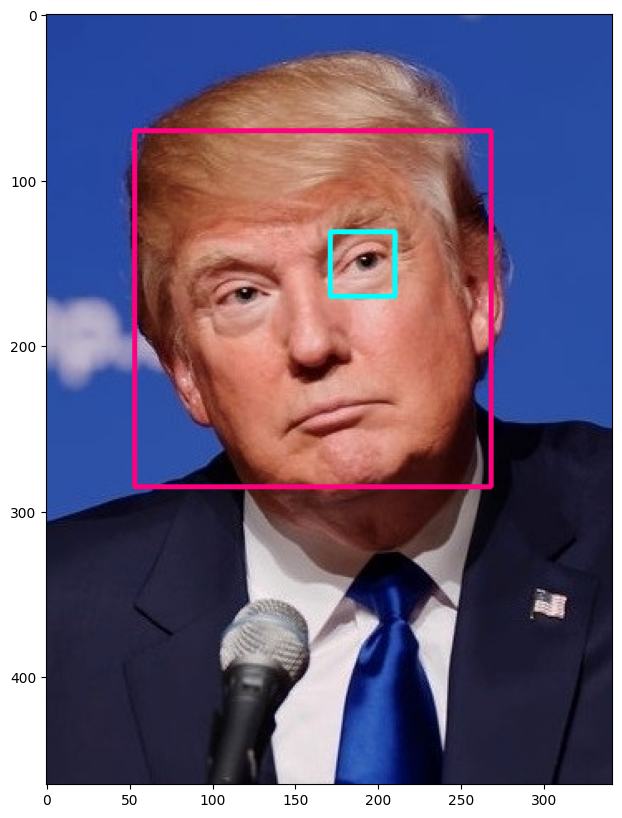

In [ ]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
eye_classifier = cv2.CascadeClassifier('Haarcascades/haarcascade_eye.xml')

image_2 = image.copy()

eyes = eye_classifier.detectMultiScale(gray, 1.2, 3)

for (ex,ey,ew,eh) in eyes:
    cv2.rectangle(image_2,(ex,ey),(ex+ew,ey+eh),(255,255,0),2)

imshow('',image_2)

<>:15: SyntaxWarning: "is" with a literal. Did you mean "=="?
<>:15: SyntaxWarning: "is" with a literal. Did you mean "=="?


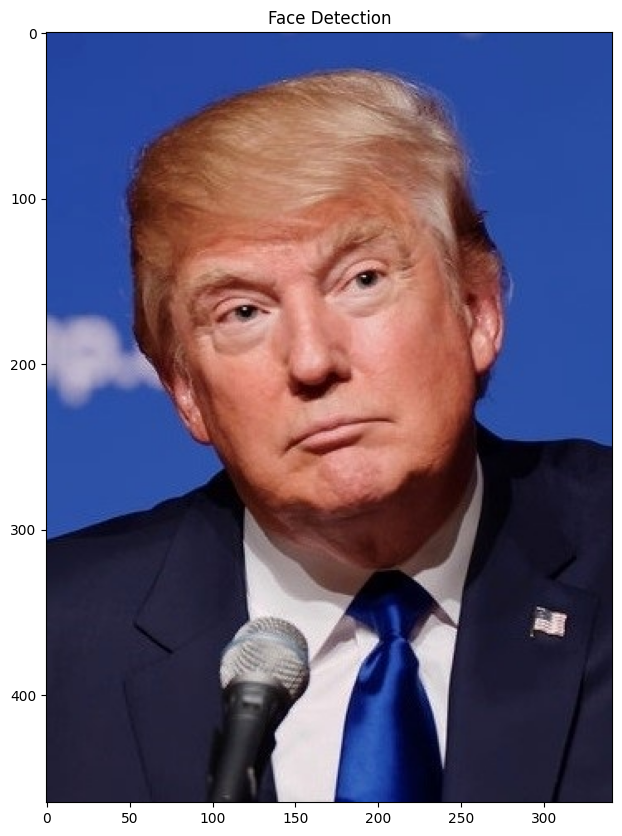

<ipython-input-6-f879a8d94d9f>:15: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if faces is ():


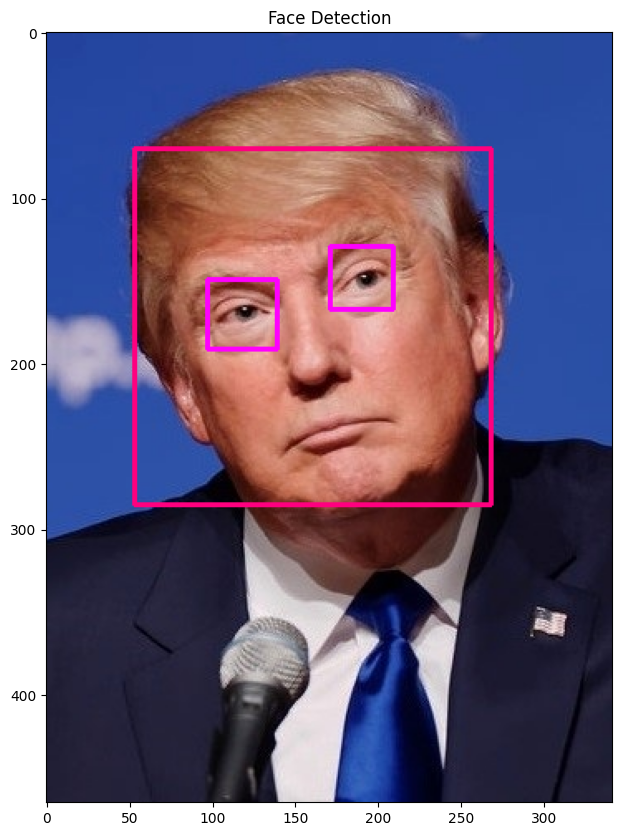

In [ ]:

image = cv2.imread('images/Trump.jpg')
imshow('Face Detection', image)

image_2 = image.copy()

face_classifier = cv2.CascadeClassifier('Haarcascades/haarcascade_frontalface_default.xml')
eye_classifier = cv2.CascadeClassifier('Haarcascades/haarcascade_eye.xml')


gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# output: x,y,w,h
faces = face_classifier.detectMultiScale(gray, scaleFactor = 1.3, minNeighbors = 5)

if faces is ():
    print("No faces found")

for (x,y,w,h) in faces:
    cv2.rectangle(image_2, (x,y), (x+w,y+h), (127,0,255), 2)

    roi_gray = gray[y:y+h, x:x+w]
    roi_color = image_2[y:y+h, x:x+w]
    eyes = eye_classifier.detectMultiScale(roi_gray, scaleFactor = 1.2)

    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color, (ex,ey), (ex+ew,ey+eh), (255,0,255), 2)


imshow('Face Detection', image_2)


In [ ]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

<IPython.core.display.Javascript object>

Saved to photo.jpg


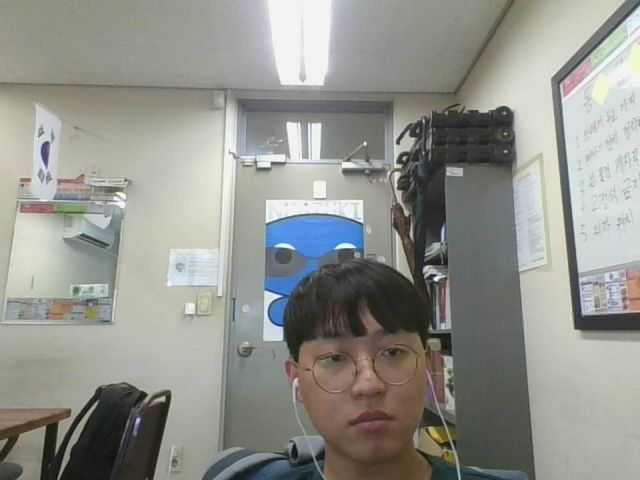

AttributeError: ignored

In [ ]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))

  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

imshow()

실시간 웹캠속 얼굴 인식:


In [ ]:
# [face detector 코드]

cap = cv2.VideoCapture(0)

while True:

    ret, frame = cap.read()
    cv2.imshow('Our Face Extractor', face_detector(frame))
    if cv2.waitKey(1) == 13: #13 is the Enter Key
        break

cap.release()
cv2.destroyAllWindows()

In [ ]:
# 로컬환경에서 실행할 경우:
pip install opencv-contrib-python

In [ ]:
!wget https://moderncomputervision.s3.eu-west-2.amazonaws.com/videos.zip

In [ ]:
!unzip -qq videos.zip

In [ ]:
cap = cv2.VideoCapture('walking.mp4')
ret, frame = cap.read()

body_classifier = cv2.CascadeClassifier('Haarcascades/haarcascade_fullbody.xml')

if ret:
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    bodies = body_classifier.detectMultiScale(gray, scaleFactor = 1.2, minNeighbors = 2)

    for (x,y,w,h) in bodies:
      cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 255), 2)

cap.release()
imshow("Pedestrian Detector", frame)


### 영상분석
1. 프레임단위 분석
2. 분석완료된 프레임을 비디오로 인코딩

```cv2.VideoWriter(video_output.avi, cv2.VideoWriter_fourcc('M','J','P','G'), FPS, (width, height))```

Formats can be:
- 'M','J','P','G' or MJPG
- MP4V
- X264
- avc1
- XVID

In [ ]:
cap = cv2.VideoCapture('walking.mp4')
w = int(cap.get(3))
h = int(cap.get(4))

output = cv2.VideoWriter('walking_output.avi', cv2.VideoWriter_fourcc('M','J','P','G'), 30, (w,h))

In [ ]:
body_classifier = cv2.CascadeClassifier('Haarcascades/haarcascade_fullbody.xml')

while True:

    ret, frame = cap.read()

    if ret:
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        bodies = body_classifier.detectMultiScale(gray, scaleFactor = 1.2, minNeighbors = 2)

        for (x,y,w,h) in bodies:
            cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 255), 2)

        output.write(frame)

    else:
        break

cap.release()
output.release()


In [ ]:
!ffmpeg -i /content/walking_output.avi walking_output.mp4 -y

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
from IPython.display import HTML
from base64 import b64encode

In [ ]:
mp4 = open('walking_output.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

FileNotFoundError: ignored

In [ ]:
# Create our video capturing object
cap = cv2.VideoCapture('cars.mp4')

# Load our vehicle classifier
vehicle_detector = cv2.CascadeClassifier('Haarcascades/haarcascade_car.xml')

# Read first frame
ret, frame = cap.read()

# Ret is True if successfully read
if ret:

  #Grayscale our image for faster processing
  gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

  # Pass frame to our body classifier
  vehicles = vehicle_detector.detectMultiScale(gray, 1.4, 2)

  # Extract bounding boxes for any bodies identified
  for (x,y,w,h) in vehicles:
      cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 255), 2)

# Release our video capture
cap.release()
imshow("Vehicle Detector", frame)

In [ ]:
# Create our video capturing object
cap = cv2.VideoCapture('cars.mp4')

# Get the height and width of the frame (required to be an interfer)
w = int(cap.get(3))
h = int(cap.get(4))

# Define the codec and create VideoWriter object.The output is stored in 'outpy.avi' file.
out = cv2.VideoWriter('cars_output.avi', cv2.VideoWriter_fourcc('M','J','P','G'), 30, (w, h))

vehicle_detector = cv2.CascadeClassifier('Haarcascades/haarcascade_car.xml')

# Loop once video is successfully loaded
while(True):

  ret, frame = cap.read()
  if ret:

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Pass frame to our body classifier
    vehicles = vehicle_detector.detectMultiScale(gray, 1.2, 3)

    # Extract bounding boxes for any bodies identified
    for (x,y,w,h) in vehicles:
        cv2.rectangle(frame, (x, y), (x+w, y+h), (0, 255, 255), 2)

    # Write the frame into the file 'output.avi'
    out.write(frame)
  else:
      break

cap.release()
out.release()

In [ ]:
!ffmpeg -i /content/cars_output.avi cars_output.mp4 -y

# Image Analysis & Transformation


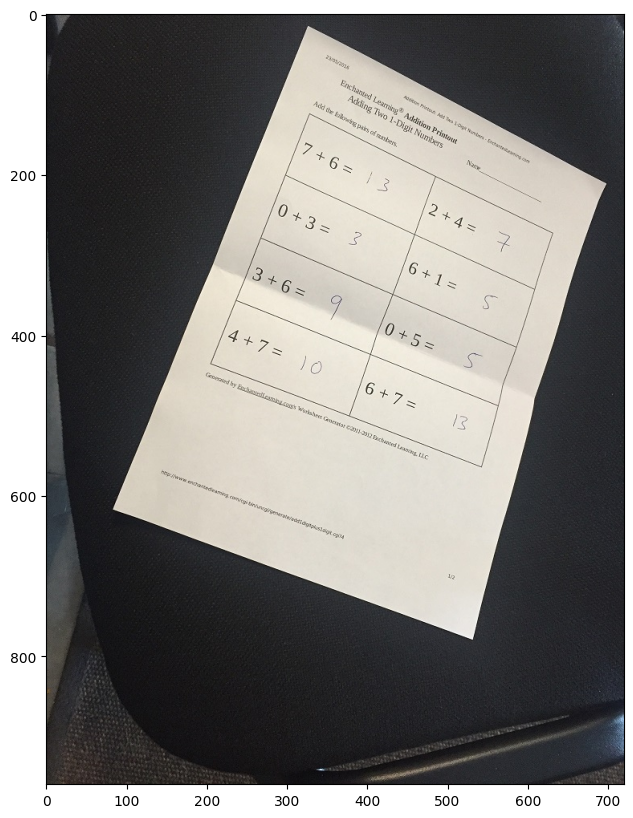

In [ ]:
image = cv2.imread('images/scan.jpg')
imshow('', image)

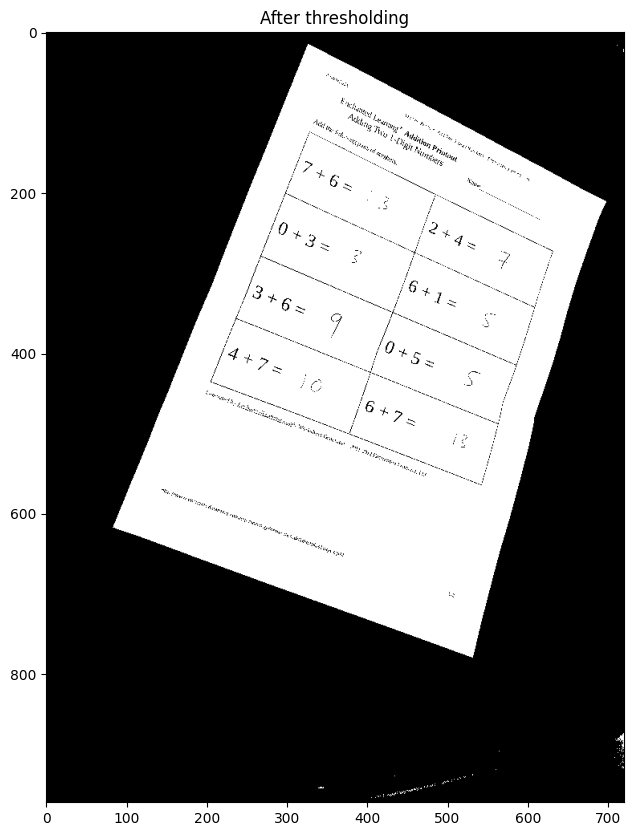

In [ ]:
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

_, th2 = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
imshow('After thresholding', th2)

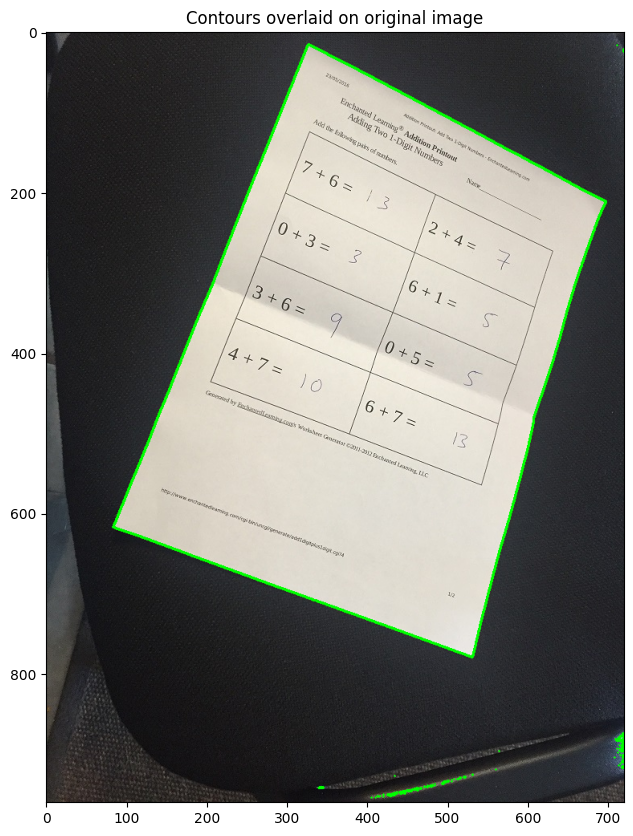

In [ ]:
contours, hierarchy = cv2.findContours(th2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(image, contours, -1, (0,255,0), thickness = 2)
imshow('Contours overlaid on original image', image)


In [ ]:
len(contours)

54

In [ ]:
sorted_contours = sorted(contours, key=cv2.contourArea, reverse=True)

for cnt in sorted_contours:
	perimeter = cv2.arcLength(cnt, True)
	approx = cv2.approxPolyDP(cnt, 0.05 * perimeter, True)

	if len(approx) == 4:
		break

In [ ]:
print("Our 4 corner points are:")
print(approx)

Our 4 corner points are:
[[[326  15]]

 [[ 83 617]]

 [[531 779]]

 [[697 211]]]


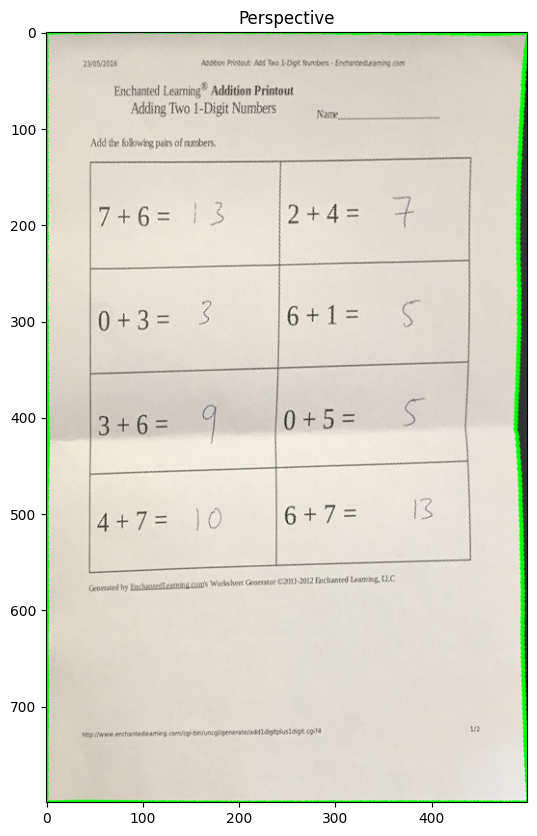

In [ ]:
inputPts = np.float32(approx)

outputPts = np.float32([[0,0],
                       [0,800],
                       [500,800],
                       [500,0]])

M = cv2.getPerspectiveTransform(inputPts,outputPts)

dst = cv2.warpPerspective(image, M, (500,800))
imshow("Perspective", dst)

## Color analysis

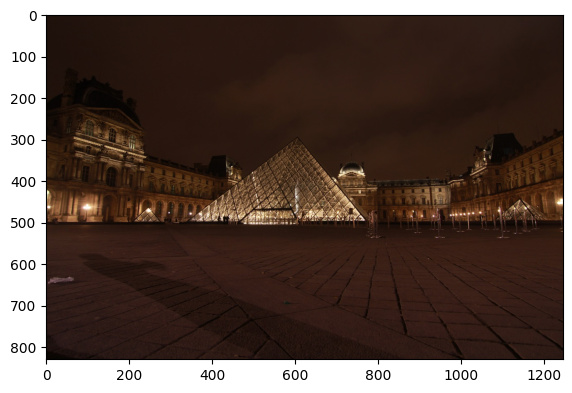

In [ ]:
image = cv2.imread('images/input.jpg')
imshow('',image)

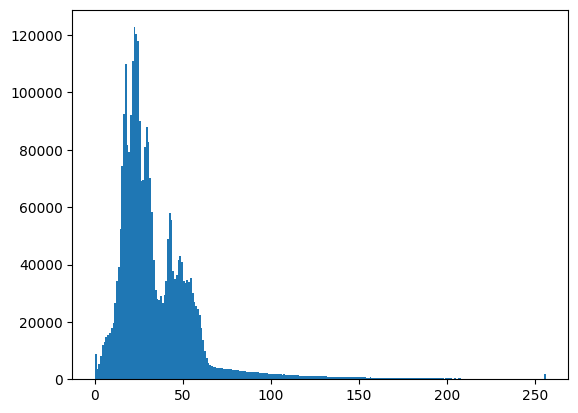

In [ ]:
plt.hist(image.ravel(), 256, [0, 256])
plt.show()


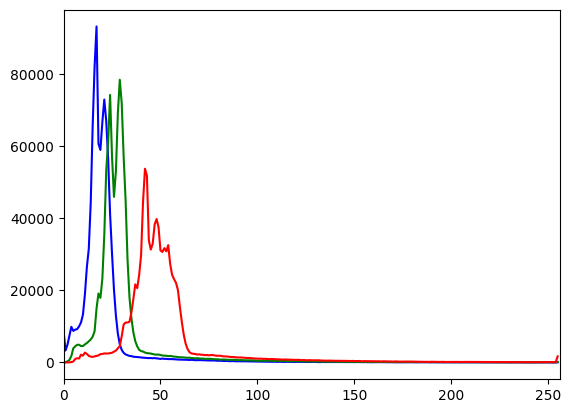

In [ ]:
color = ('b', 'g', 'r')

for i, col in enumerate(color):
    histogram2 = cv2.calcHist([image], [i], None, [256], [0, 256])
    plt.plot(histogram2, color = col)
    plt.xlim([0,256])

plt.show()

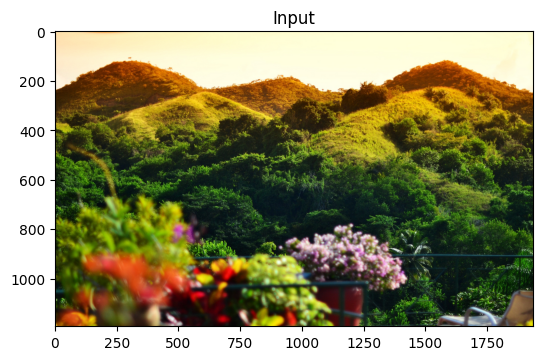

In [ ]:
image = cv2.imread('images/tobago.jpg')
imshow("Input", image)

# 군집분석

In [ ]:
def centroidHistogram(clt):
    # Create a histrogram for the clusters based on the pixels in each cluster
    # Get the labels for each cluster
    numLabels = np.arange(0, len(np.unique(clt.labels_)) + 1)

    # Create our histogram
    (hist, _) = np.histogram(clt.labels_, bins = numLabels)

    # normalize the histogram, so that it sums to one
    hist = hist.astype("float")
    hist /= hist.sum()

    return hist

def plotColors(hist, centroids):
    # Create our blank barchart
    bar = np.zeros((100, 500, 3), dtype = "uint8")

    x_start = 0
    # iterate over the percentage and dominant color of each cluster
    for (percent, color) in zip(hist, centroids):
      # plot the relative percentage of each cluster
      end = x_start + (percent * 500)
      cv2.rectangle(bar, (int(x_start), 0), (int(end), 100),
        color.astype("uint8").tolist(), -1)
      x_start = end
    return bar

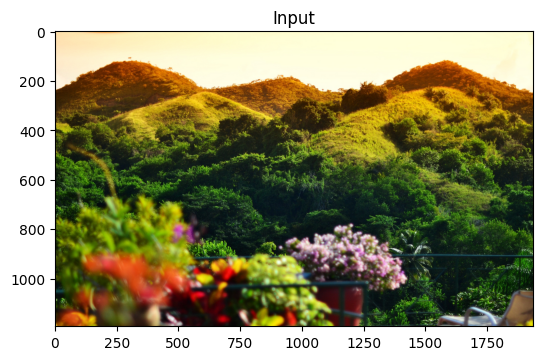

(1194, 1936, 3)


In [ ]:
from sklearn.cluster import KMeans

image = cv2.imread('images/tobago.jpg')
imshow("Input", image)

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
print(image.shape)

In [ ]:
image = image.reshape((image.shape[0] * image.shape[1], 3))
print(image.shape)

(2311584, 3)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


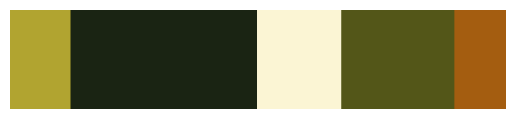

In [ ]:
number_of_clusters = 5
clt = KMeans(number_of_clusters)
clt.fit(image)

hist = centroidHistogram(clt)
bar = plotColors(hist, clt.cluster_centers_)

# show our color bart
plt.figure()
plt.axis("off")
plt.imshow(bar)
plt.show()

In [ ]:
def mse(image1, image2):
	# Images must be of the same dimension
	error = np.sum((image1.astype("float") - image2.astype("float")) ** 2)
	error /= float(image1.shape[0] * image1.shape[1])

	return error

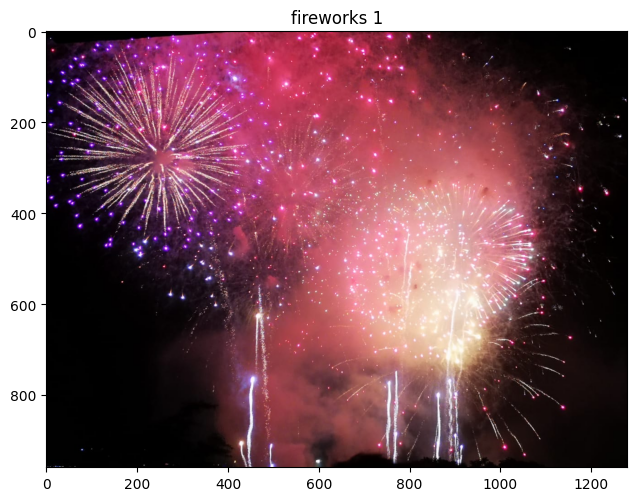

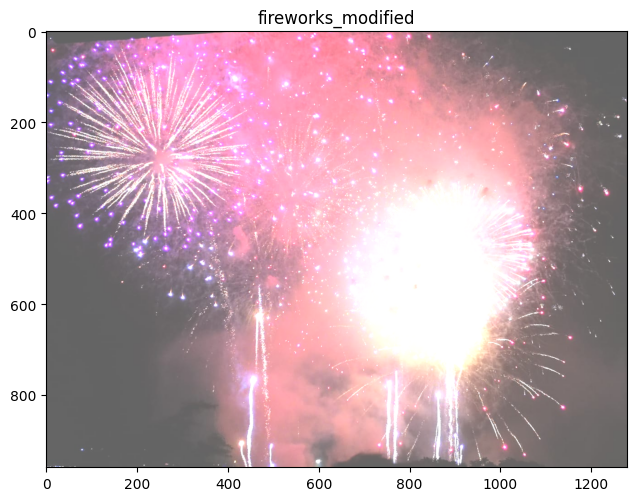

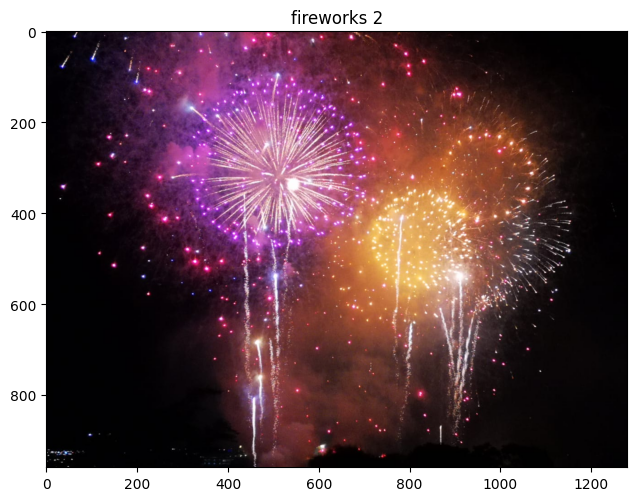

In [ ]:
fireworks1 = cv2.imread('images/fireworks.jpeg')
fireworks2 = cv2.imread('images/fireworks2.jpeg')

M = np.ones(fireworks1.shape, dtype = "uint8") * 100
fireworks1b = cv2.add(fireworks1, M)

imshow("fireworks 1", fireworks1)
imshow("fireworks_modified", fireworks1b)
imshow("fireworks 2", fireworks2)

In [ ]:
from skimage.metrics import structural_similarity

def compare(image1, image2):
  image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
  image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
  print('MSE = {:.2f}'.format(mse(image1, image2)))
  print('SS = {:.2f}'.format(structural_similarity(image1, image2)))

In [ ]:
compare(fireworks1, fireworks1)

MSE = 0.00
SS = 1.00


In [ ]:
compare(fireworks1, fireworks1b)

MSE = 8809.38
SS = 0.52


In [ ]:
compare(fireworks1, fireworks2)

MSE = 2125.41
SS = 0.48


# Color filteration

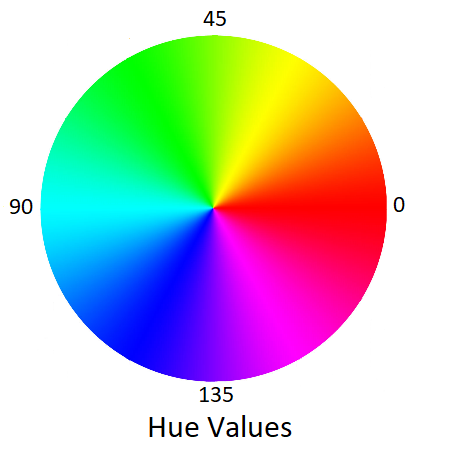

- Hue: 0 - 179
- Saturation: 0 - 255
- Value (Intensity): 0 - 255

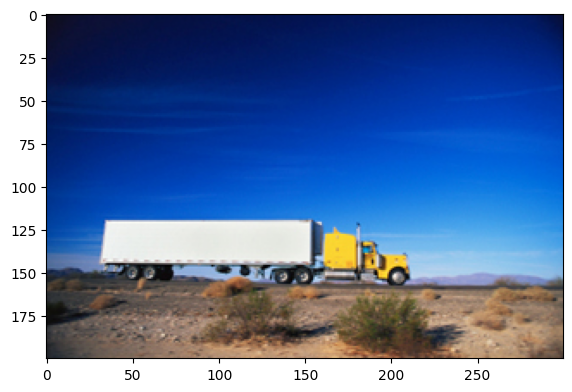

In [ ]:
image = cv2.imread('images/truck.jpg')
imshow('',image)

hsv_img = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

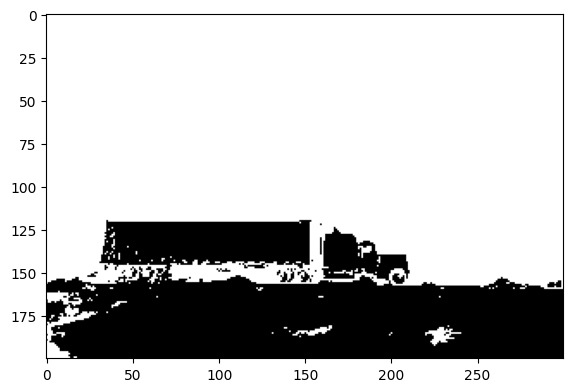

In [ ]:
lower = np.array([90,0,0])
upper = np.array([135,255,255])

# 파란마스크
mask_1 = cv2.inRange(hsv_img, lower, upper)
imshow('',mask_1)


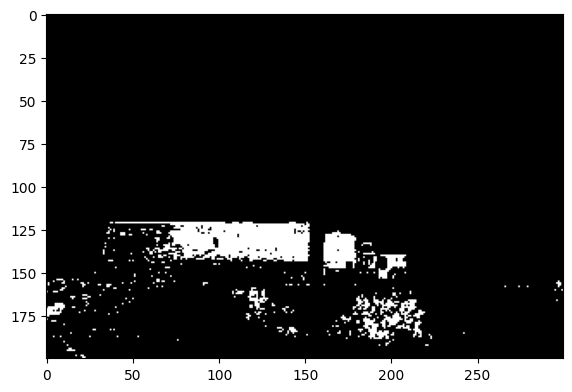

In [ ]:
lower = np.array([22,0,0])
upper = np.array([45,255,255])

# 노란마스크
mask_2 = cv2.inRange(hsv_img, lower, upper)
imshow('',mask_2)

In [ ]:
mask = mask_1 + mask_2

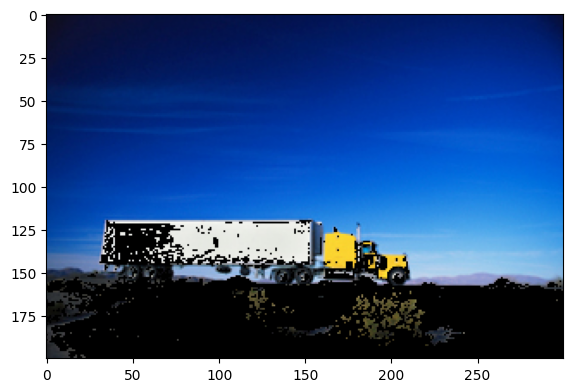

In [ ]:
res = cv2.bitwise_and(image, image, mask=mask)
imshow('',res)

##### 실습
아래 이미지에서 빨간색 / 머리 만 제거하시오.

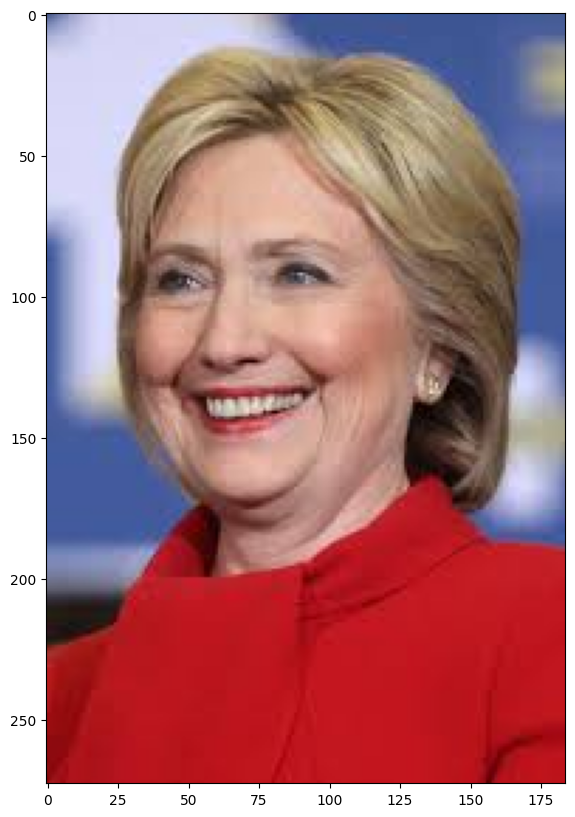

In [ ]:
image = cv2.imread("./images/Hillary.jpg")
imshow('',image)

## Watershed algorithm을 활용한 image segmentation

In [ ]:
def imshow(title = "Image", image = None, size = 10):
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

In [ ]:
!wget https://docs.opencv.org/3.4/water_coins.jpg

--2023-08-08 08:08:51--  https://docs.opencv.org/3.4/water_coins.jpg
Resolving docs.opencv.org (docs.opencv.org)... 104.21.24.86, 172.67.218.21, 2606:4700:3033::6815:1856, ...
Connecting to docs.opencv.org (docs.opencv.org)|104.21.24.86|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 16322 (16K) [image/jpeg]
Saving to: ‘water_coins.jpg’

water_coins.jpg     100%[===================>]  15.94K  --.-KB/s    in 0s      

2023-08-08 08:08:51 (75.9 MB/s) - ‘water_coins.jpg’ saved [16322/16322]



In [ ]:
%cd /content/images
!ls

/content/images
4star.jpg			     fireworks.jpeg	 Origin_of_Species.jpg
abraham.jpg			     flowers.jpeg	 output.jpg
abraham_mask.png		     gradient.jpg	 oxfordlibrary.jpeg
beatle.jpg			     hand.jpg		 photorestore.JPG
blacksandbeach.jpeg		     Hillary.jpg	 pubfood.jpeg
blobs.jpg			     hilton.jpeg	 ramen.jpeg
bottlecaps.jpg			     house.jpg		 rot.jpg
box_in_scene.png		     houseonhill.jpeg	 scan.jpg
bunchofshapes.jpg		     iceland_rum.jpeg	 shapes_donut.jpg
candy.jpg			     IMG_7539.jpg	 shapes.jpg
cars.avi			     IMG_8295.JPG	 shapestomatch.jpg
castara.jpeg			     input33.JPG	 soduku.jpg
chess.JPG			     input.jpg		 someshapes.jpg
chihuahua.jpg			     kim.jpg		 Sunflowers.jpg
church_iceland.jpeg		     liberty.jpeg	 tobago.jpg
coffee.jpg			     londonxmas2.jpeg	 tommys_beers.jpeg
coffee_view.jpeg		     londonxmas.jpeg	 trees.jpeg
contours.jpg			     lourve_noise.jpg	 truck.jpg
digits.png			     LP.jpg		 Trump.jpg
domino.png			     marsface.jpg	 view.jpeg
download.png			     mask.jpg		 V

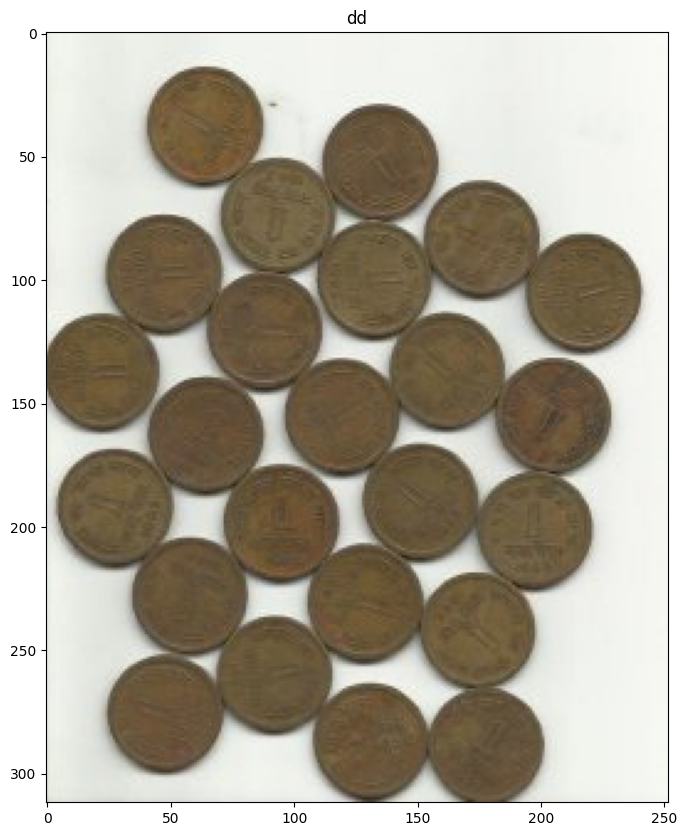

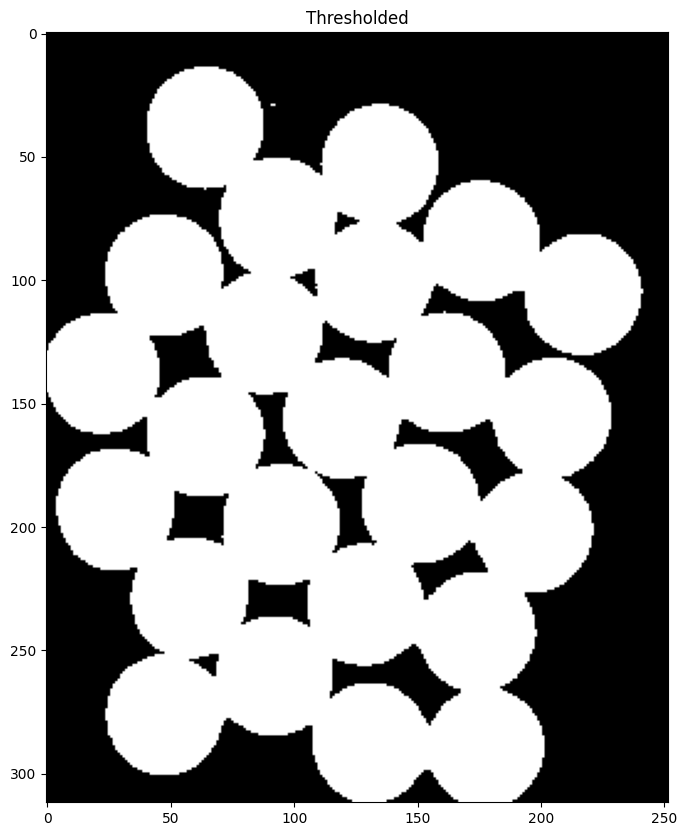

In [ ]:
# Load image
img = cv2.imread('/content/water_coins.jpg')
imshow("dd", img)

# Grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Threshold using OTSU
ret, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

imshow("Thresholded", thresh)

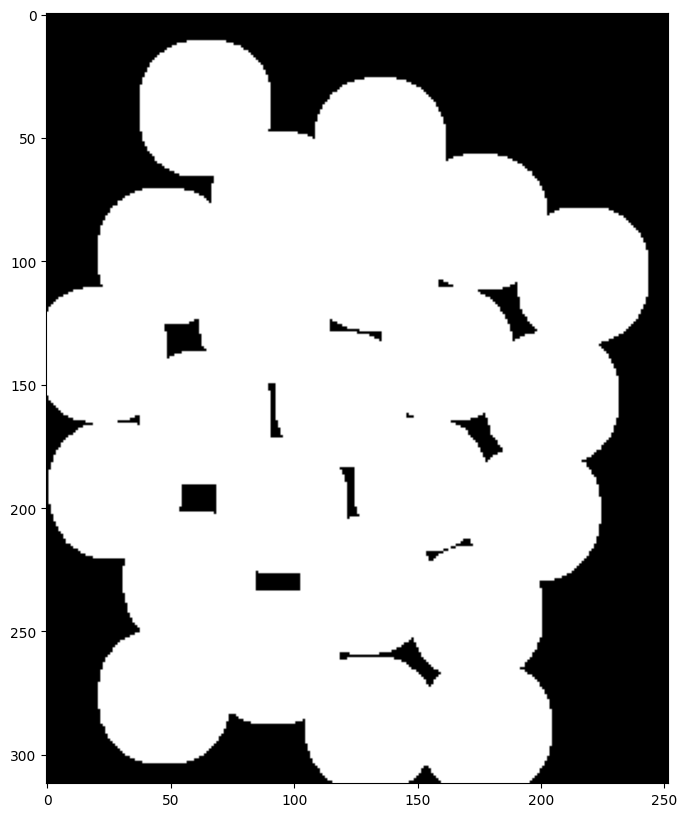

In [ ]:
kernel = np.ones((3,3), np.uint8)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN,kernel, iterations = 2)

# sure background
sure_bg = cv2.dilate(opening, kernel, iterations=3)
imshow('',sure_bg)



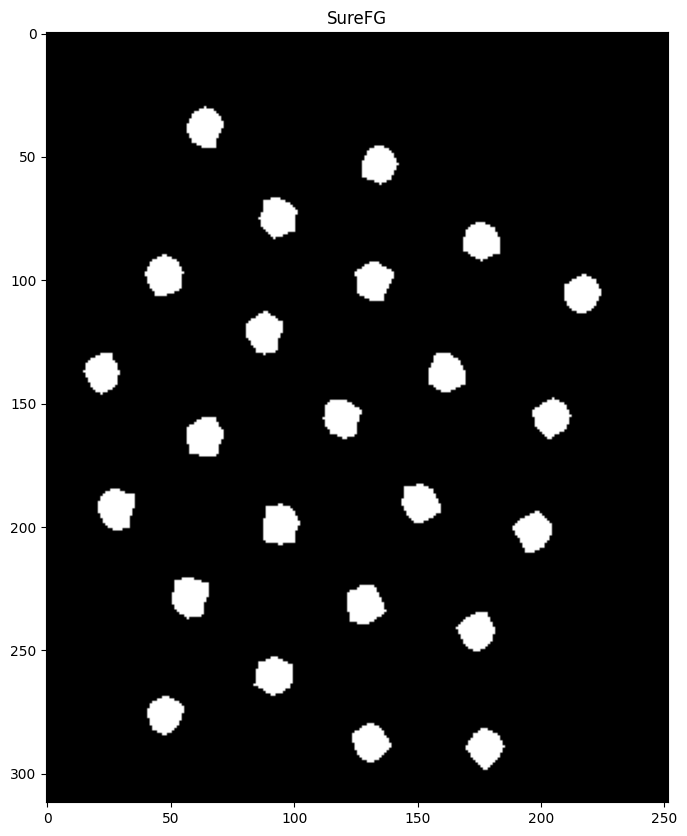

In [ ]:
# sure Foreground
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2,5)
ret, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)
sure_fg = np.uint8(sure_fg)
imshow("SureFG", sure_fg)

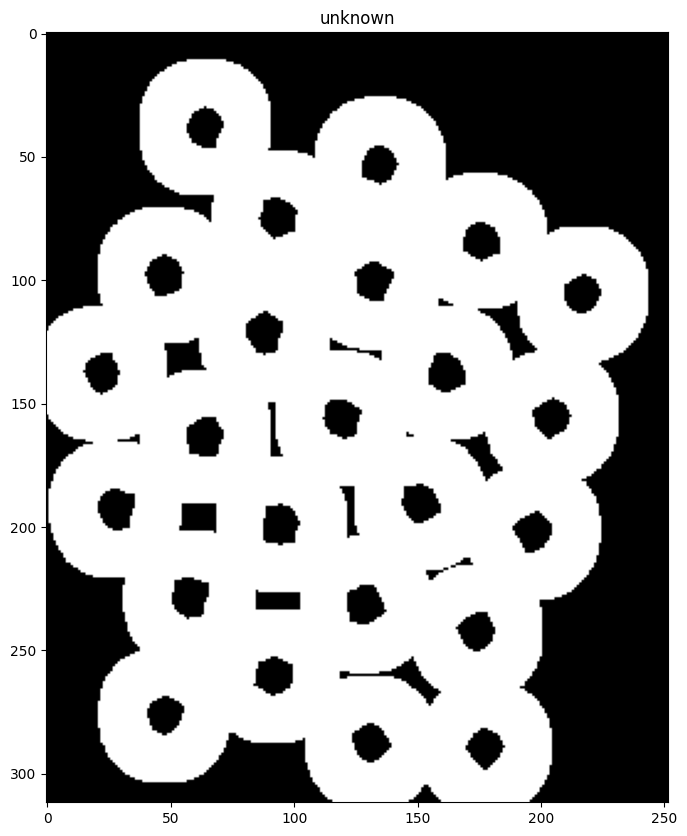

In [ ]:
unknown = cv2.subtract(sure_bg, sure_fg)
imshow("unknown", unknown)

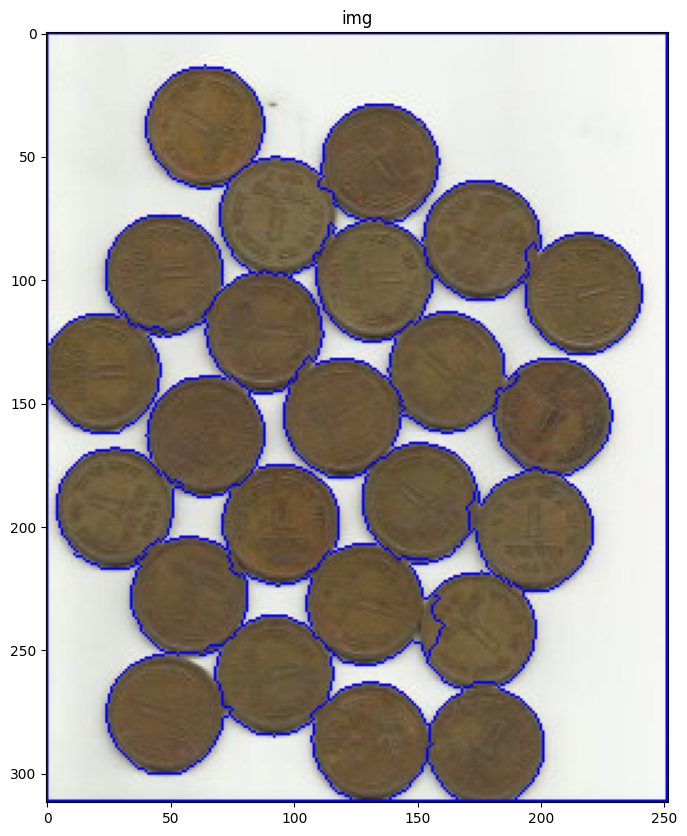

In [ ]:
ret, markers = cv2.connectedComponents(sure_fg)
markers = markers+1
markers[unknown==255] = 0
markers = cv2.watershed(img,markers)
img[markers == -1] = [255,0,0]

imshow("img", img)

In [ ]:
!wget https://github.com/rajeevratan84/ModernComputerVision/raw/main/walking_short_clip.mp4

--2023-08-08 08:10:05--  https://github.com/rajeevratan84/ModernComputerVision/raw/main/walking_short_clip.mp4
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rajeevratan84/ModernComputerVision/main/walking_short_clip.mp4 [following]
--2023-08-08 08:10:05--  https://raw.githubusercontent.com/rajeevratan84/ModernComputerVision/main/walking_short_clip.mp4
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 181894 (178K) [application/octet-stream]
Saving to: ‘walking_short_clip.mp4’

walking_short_clip. 100%[===================>] 177.63K  --.-KB/s    in 0.03s   

2023-08-08 08:10:06 (5.97 MB/s) - ‘walk

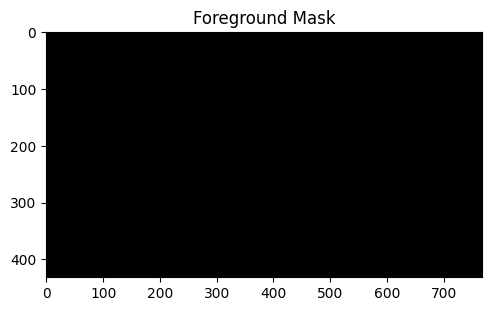

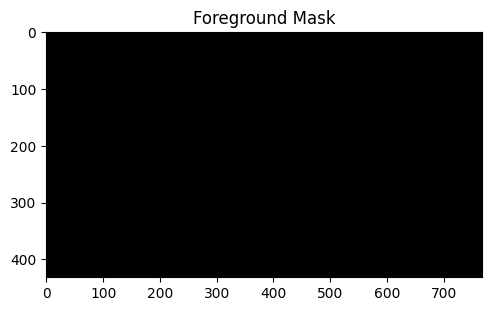

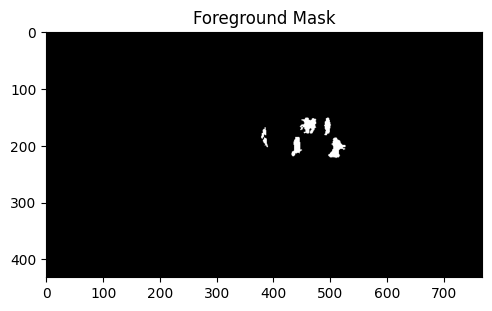

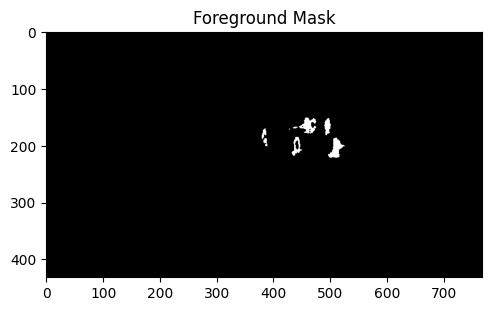

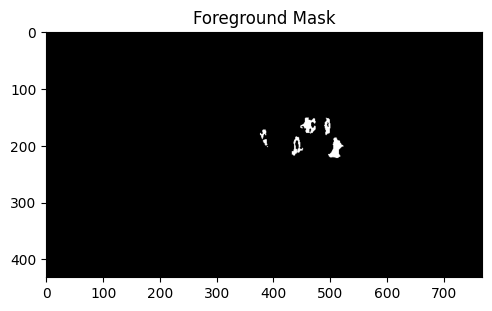

...

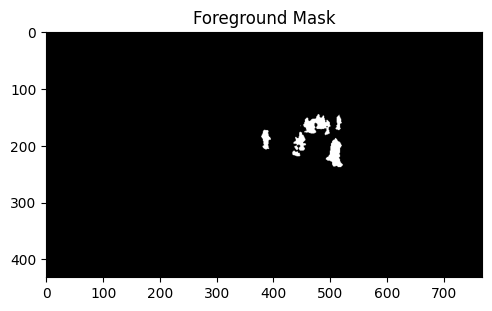

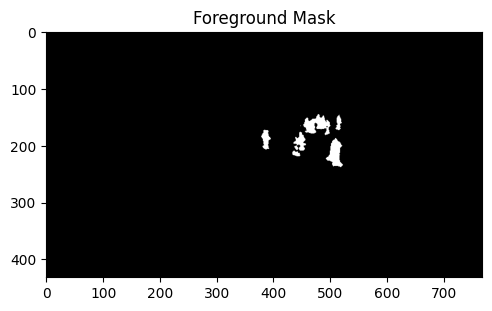

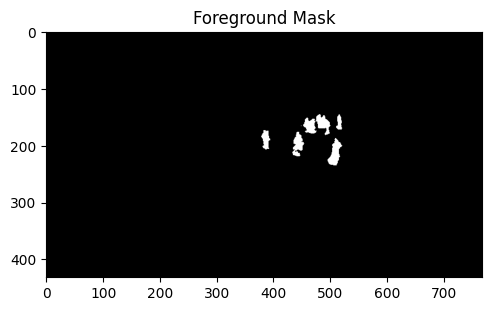

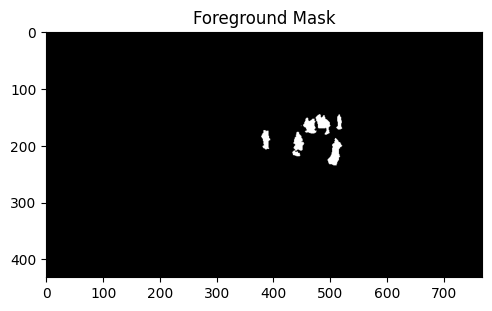

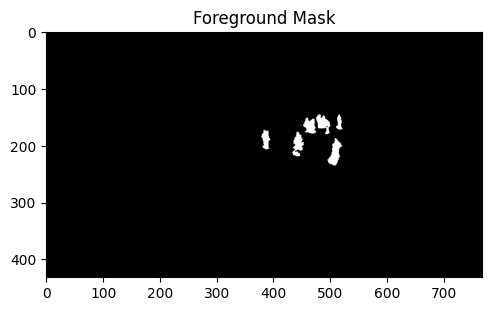

In [ ]:
cap = cv2.VideoCapture('walking_short_clip.mp4')

# Get the height and width of the frame (required to be an interfer)
w = int(cap.get(3))
h = int(cap.get(4))

# Define the codec and create VideoWriter object.The output is stored in 'outpy.avi' file.
out = cv2.VideoWriter('walking_output_AGMM.avi', cv2.VideoWriter_fourcc('M','J','P','G'), 30, (w, h))

# Initlaize background subtractor
foreground_background = cv2.bgsegm.createBackgroundSubtractorGSOC()

# Loop once video is successfully loaded
while True:

    ret, frame = cap.read()
    if ret:
      # Apply background subtractor to get our foreground mask
      foreground_mask = foreground_background.apply(frame)
      out.write(foreground_mask)
      imshow("Foreground Mask", foreground_mask)
    else:
      break

cap.release()
out.release()

#counting blobs

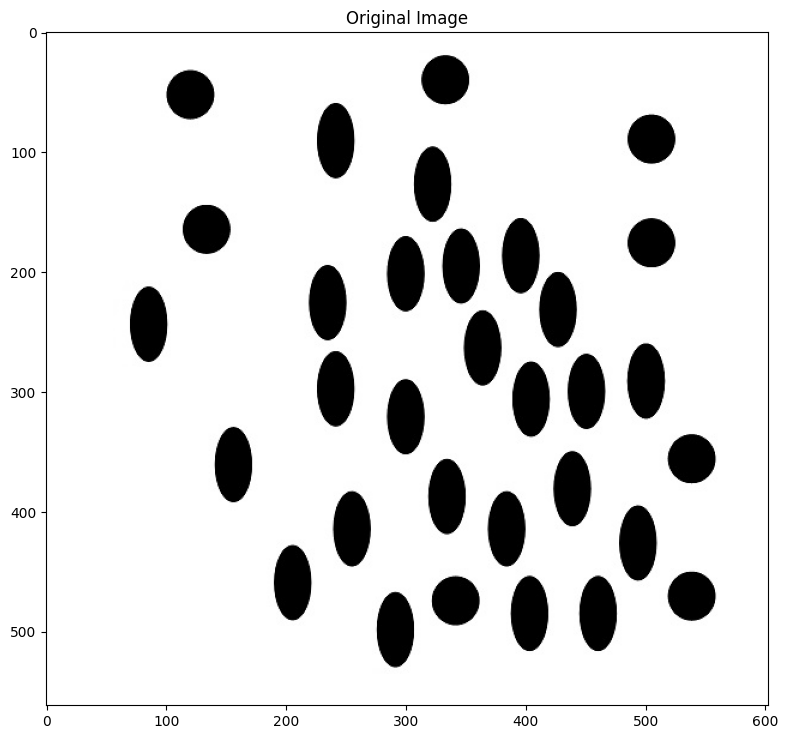

In [ ]:
# Load image
image = cv2.imread("blobs.jpg", 0)
imshow('Original Image',image)

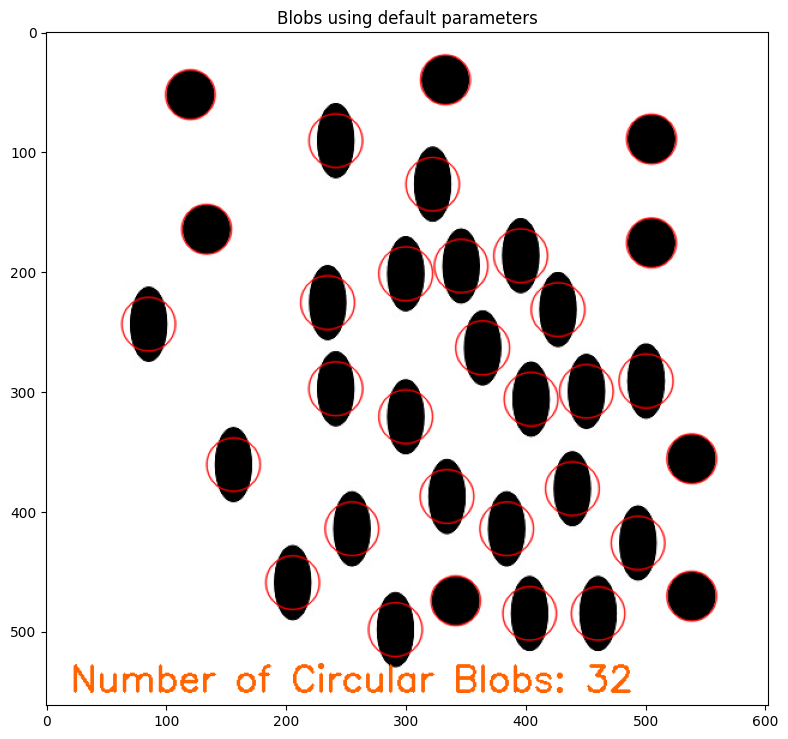

In [ ]:
detector = cv2.SimpleBlobDetector_create()
keypoints = detector.detect(image)

blank = np.zeros((1,1))
blobs = cv2.drawKeypoints(image, keypoints, blank, (0,0,255),
                                      cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

number_of_blobs = len(keypoints)
text = "Number of Circular Blobs: " + str(len(keypoints))
cv2.putText(blobs, text, (20, 550), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 100, 255), 2)

imshow("Blobs using default parameters", blobs)

In [ ]:
params = cv2.SimpleBlobDetector_Params()

params.filterByArea = True
params.minArea = 100

params.filterByCircularity = True
params.minCircularity = 0.9

params.filterByConvexity = False
params.minConvexity = 0.2

params.filterByInertia = True
params.minInertiaRatio = 0.01

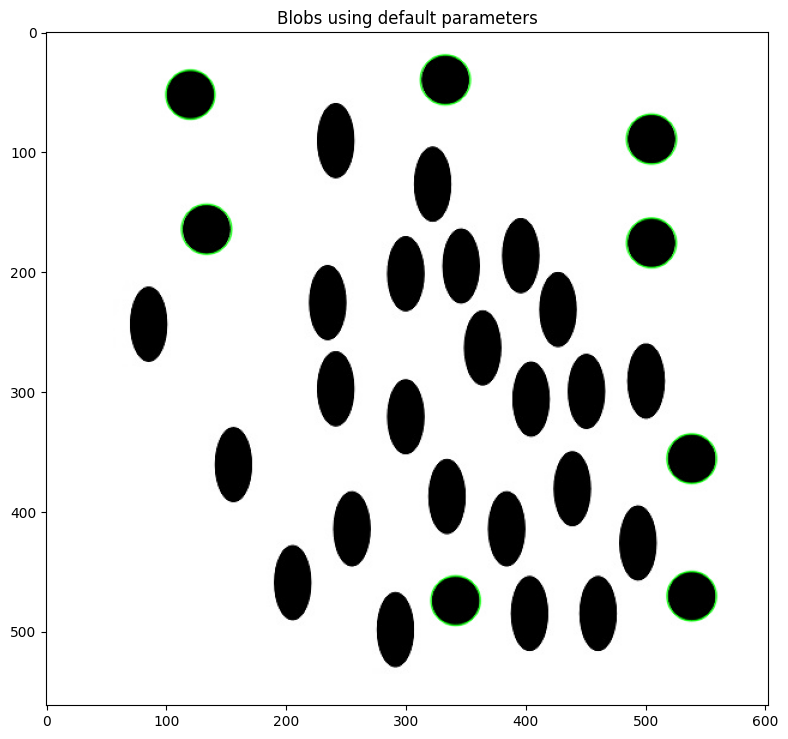

In [ ]:
detector = cv2.SimpleBlobDetector_create(params)
keypoints = detector.detect(image)

blank = np.zeros((1,1))
blobs = cv2.drawKeypoints(image, keypoints, blank, (0,255,0),
                                      cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

number_of_blobs = len(keypoints)
text = "Number of Circular Blobs: " + str(len(keypoints))
cv2.putText(blobs, text, (20, 4000), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 255), 2)

imshow("Blobs using default parameters", blobs)

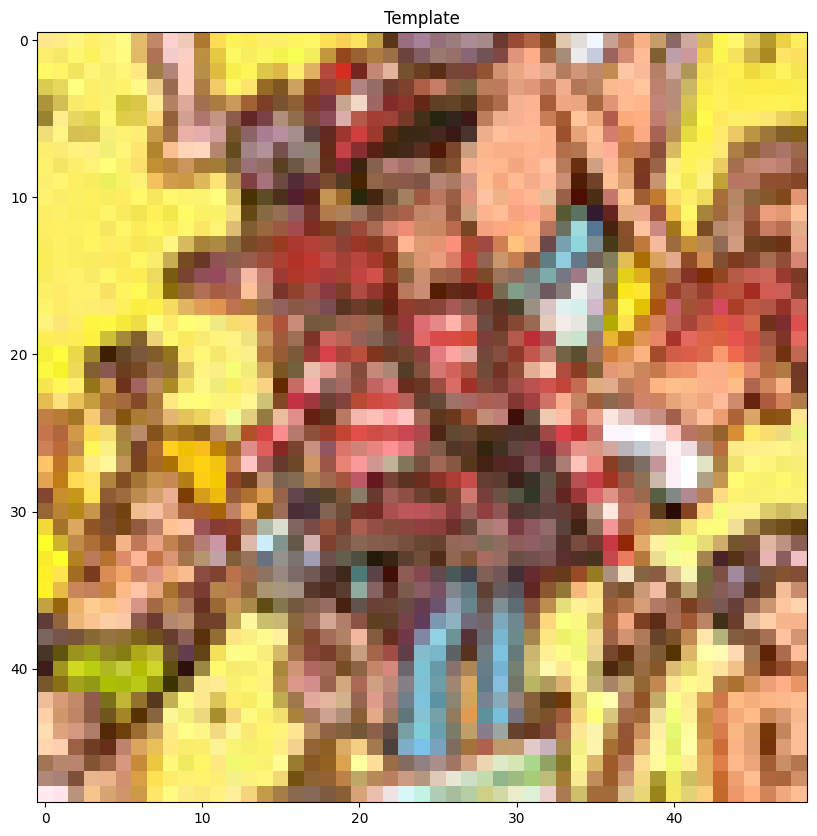

In [ ]:
template = cv2.imread('waldo.jpg')
imshow('Template', template)



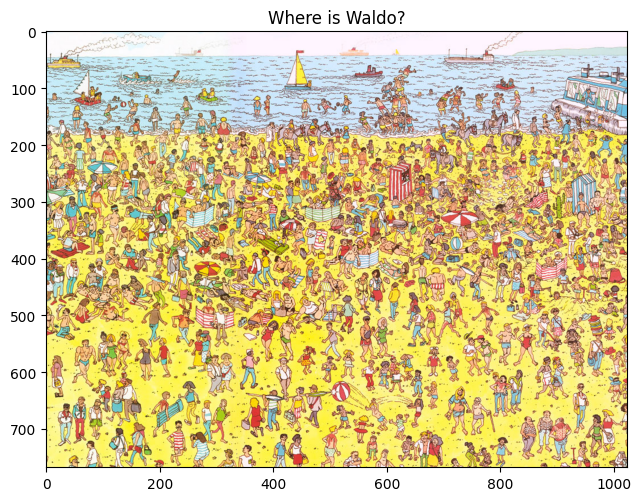

In [ ]:
image = cv2.imread('WaldoBeach.jpg')
imshow('Where is Waldo?', image)

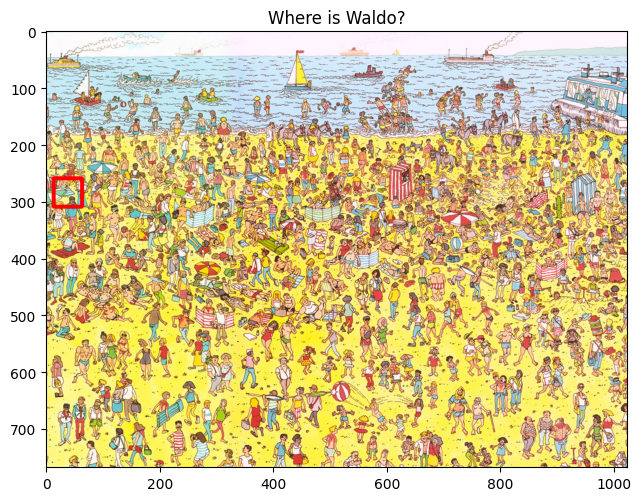

In [ ]:
template = cv2.imread('waldo.jpg', 0)

result = cv2.matchTemplate(gray, template, cv2.TM_CCOEFF)

min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

top_left = max_loc

bottom_right = (top_left[0] + 50, top_left[1] + 50)
cv2.rectangle(image, top_left, bottom_right, (0,0,255), 5)
imshow('Where is Waldo?', image)